# Article Relevance Prediction for NeotomaDB

This notebook contains the following tasks:
1. Extract CrossRef metadata of articles that currently exist in Neotoma.csv (positive cases)
2. Extract CrossRef metadata of new articles sent from Simon
3. Extract CrossRef metadata of other negative cases that do not exist in NeotomaDB (negative cases)
4. Data cleaning and saved as csv file
5. Create train test dataset
6. Baseline model: logistic regression with BOW features


### Imports

In [91]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from IPython.display import Image
pd.set_option("display.max_colwidth", 200)

## 1. Extract CrossRef Metadata for Articles in NeotomaDB

The neotoma.csv file is provided by our partner. 

It contains 6889 site records from 2316 sites.

The csv file contains data contributed from 758 distinct articles. 

Note that only 244 of these articles has abstract.

In [92]:
import requests
import json
import os

In [93]:
# load csv
# neotoma = pd.read_csv("../data/hackathon_data/neotoma_crossref_fixed.csv").iloc[:, 0:-2]
# neotoma.info()

In [94]:
# neotoma['doi'].value_counts()

In [95]:
# neotoma['sitename'].value_counts()

### 8 DOI Not Found, Replaced

In [96]:
# dot_status_df = pd.DataFrame(doi_status)
# dot_status_df.query("status_code == 404")['doi'].to_list()

In [97]:
# doi_replace = {
#     '10.2307/1551601\xa0 ' : '10.2307/1551601',
#     '10.2307/1551050\xa0 ' : '10.2307/1551050',
#     '10.1016/j.revpalbo.2004.09.004\xa0 ': '10.1016/j.revpalbo.2004.09.004',
#     '10.1016/j.quascirev.2016.09.023.' : '10.1016/j.quascirev.2016.09.023',
#     'Widga, C., S.N. Lengyel, J. Saunders, G. Hodgins, J.D. Walker, and A.D. Wanamaker. 2017. Late Pleistocene proboscidean population dynamics in the North American Midcontinent. Boreas 46(4):772-782. [DOI: 10.1111/bor.12235]': '10.1111/bor.12235',
#     "Fiedel, S.J. 2018. The spore conundrum: Does a dung fungus decline signal humans' arrival in the Eastern United States?. Quaternary International 466:247e255. [DOI: doi.org/10.1016/j.quaint.2015.11.130]": '10.1016/j.quaint.2015.11.130',
#     'Joyce, D.J. 2006. Chronology and new research on the Schaefer mammoth (? Mammuthus primigenius) site, Kenosha County, Wisconsin, USA,. Quaternary International 142:44-57. [DOI: doi:10.1016/j.quaint.2005.03.004]': '10.1016/j.quaint.2005.03.004',
#     'Overstreet, D.F., and M.F. Kolb. 2003. Geoarchaeological contexts for Late Pleistocene archaeological sites with human‐modified woolly mammoth remains in southeastern Wisconsin, USA. Geoarchaeology 18(1):91-114. [DOI: DOI:10.1002/gea.10052]': '10.1002/gea.10052'
# }
# neotoma['doi'].replace(to_replace=doi_replace, inplace=True)

### Download metadata from CrossRef

In [98]:
# # Query Metadata from DOI
# doi_list = neotoma['doi'].unique().tolist()
# # testing purpose: take the first 10
# # input_doi = doi_list
# input_doi = doi_list

# doi_status = {}
# doi_status['doi'] = input_doi
# doi_status['status_code'] = []

# for doi in input_doi:
#     cross_ref_url = f"https://api.crossref.org/works/{doi}"

#     # make a request to the API
#     cross_ref_response = requests.get(cross_ref_url)

#     doi_status['status_code'].append(cross_ref_response.status_code)

#     if cross_ref_response.status_code == 200:

#         # save data
#         ref_data = cross_ref_response.json()
        
#         # create the directory if it doesn't exist 
#         directory = '../data/raw/crossref'
#         if not os.path.exists(directory):
#             os.makedirs(directory)

#         # save the JSON data to a file
#         doi_clean = doi.replace("/", "_")
#         filename = f'crossref_{doi_clean}.json'
#         filepath = os.path.join(directory, filename)
#         with open(filepath, 'w') as outfile:
#             json.dump(ref_data, outfile)

#     else:
#         print("DOI not found:", doi, "status_code", cross_ref_response.status_code)

### Positive Cases CrossRef Data Import

In [99]:
# Set the directory path
directory_path = "../data/raw/crossref/positive/"
# Get a list of all files and directories in the directory
files_and_directories = os.listdir(directory_path)
# Filter out the directories to get only the files
files = [file for file in files_and_directories if os.path.isfile(os.path.join(directory_path, file))]
if '.DS_Store' in files:
    files.remove('.DS_Store')
len(files)

757

In [100]:
# initialize empty dataframe
neotoma_crossref_df = pd.DataFrame()

# Populate the cross ref df
for f in files:
    file_path = f"../data/raw/crossref/positive/{f}"
    onefile = pd.read_json(file_path)
    onefile = pd.DataFrame(onefile.loc[:, 'message']).T.reset_index()
    
    # merge
    neotoma_crossref_df = pd.concat([neotoma_crossref_df, onefile])

neotoma_crossref_df["target"] = 1

neotoma_crossref_df.info()


<class 'pandas.core.frame.DataFrame'>
Int64Index: 757 entries, 0 to 0
Data columns (total 55 columns):
 #   Column                  Non-Null Count  Dtype 
---  ------                  --------------  ----- 
 0   index                   757 non-null    object
 1   DOI                     757 non-null    object
 2   ISSN                    745 non-null    object
 3   URL                     757 non-null    object
 4   alternative-id          598 non-null    object
 5   author                  751 non-null    object
 6   container-title         757 non-null    object
 7   content-domain          757 non-null    object
 8   created                 757 non-null    object
 9   deposited               757 non-null    object
 10  indexed                 757 non-null    object
 11  is-referenced-by-count  757 non-null    object
 12  issn-type               745 non-null    object
 13  issue                   673 non-null    object
 14  issued                  757 non-null    object
 15  journal-

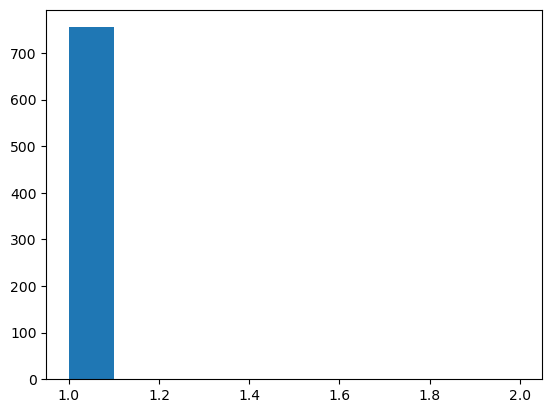

In [101]:
counts = neotoma_crossref_df['DOI'].value_counts()
plt.hist(counts)
plt.show()

### Negative Cases CrossRef Data Import

#### Sample code to search GDD

In [102]:
# #term to search GeoDeepDive
# term = "Animal"
# # Number of articles to return
# n = 100

# response = requests.get("https://geodeepdive.org/api/articles?term=" + term + "&max=" + str(n) + "&type=journal-article")
# if cross_ref_response.status_code == 200:

#         # save data
#         ref_data = response.json()
        
#         # create the directory if it doesn't exist 
#         directory = '../data/raw/negative'
#         if not os.path.exists(directory):
#             os.makedirs(directory)

#         # save the JSON data to a file
#         doi_clean = doi.replace("/", "_")
#         filename = f'crossref_{doi_clean}.json'
#         filepath = os.path.join(directory, filename)
#         with open(filepath, 'w') as outfile:
#             json.dump(ref_data, outfile)

# else:
#     print("DOI not found:", doi, "status_code", cross_ref_response.status_code)

In [103]:
# Set the directory path
directory_path = "../data/raw/crossref/negative/"
# Get a list of all files and directories in the directory
files_and_directories = os.listdir(directory_path)
# Filter out the directories to get only the files
files = [file for file in files_and_directories if os.path.isfile(os.path.join(directory_path, file))]
if '.DS_Store' in files:
    files.remove('.DS_Store')
len(files)

1786

In [104]:
# initialize empty dataframe
negative_crossref_df = pd.DataFrame()

# Populate the cross ref df
for f in files:
    file_path = f"../data/raw/crossref/negative/{f}"
    onefile = pd.read_json(file_path)
    onefile = pd.DataFrame(onefile.loc[:, 'message']).T.reset_index()
    
    # merge
    negative_crossref_df = pd.concat([negative_crossref_df, onefile])
negative_crossref_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1786 entries, 0 to 0
Data columns (total 50 columns):
 #   Column                  Non-Null Count  Dtype 
---  ------                  --------------  ----- 
 0   index                   1786 non-null   object
 1   DOI                     1786 non-null   object
 2   ISSN                    1784 non-null   object
 3   URL                     1786 non-null   object
 4   archive                 475 non-null    object
 5   author                  1335 non-null   object
 6   container-title         1786 non-null   object
 7   content-domain          1786 non-null   object
 8   created                 1786 non-null   object
 9   deposited               1786 non-null   object
 10  indexed                 1786 non-null   object
 11  is-referenced-by-count  1786 non-null   object
 12  issn-type               1784 non-null   object
 13  issue                   1501 non-null   object
 14  issued                  1786 non-null   object
 15  journal

In [105]:
negative_crossref_df.head(3)

,index,DOI,ISSN,URL,archive,author,container-title,content-domain,created,deposited,...,volume,alternative-id,assertion,funder,update-policy,abstract,editor,published-other,update-to,article-number
0,message,10.1002/chin.201507318,[0931-7597],http://dx.doi.org/10.1002/chin.201507318,[Portico],"[{'given': 'Kristof', 'family': 'Kranjc', 'sequence': 'first', 'affiliation': []}, {'given': 'Marijan Koc', 'family': 'evar', 'sequence': 'additional', 'affiliation': []}]",[ChemInform],"{'domain': [], 'crossmark-restriction': False}","{'date-parts': [[2015, 1, 29]], 'date-time': '2015-01-29T10:38:37Z', 'timestamp': 1422527917000}","{'date-parts': [[2021, 7, 2]], 'date-time': '2021-07-02T09:01:39Z', 'timestamp': 1625216499000}",...,46,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
0,message,10.1002/chem.201590048,[0947-6539],http://dx.doi.org/10.1002/chem.201590048,NaN,"[{'given': 'Jin-Long', 'family': 'Wang', 'sequence': 'first', 'affiliation': []}, {'given': 'Jian-Wei', 'family': 'Liu', 'sequence': 'additional', 'affiliation': []}, {'given': 'Bing-Zhang', 'fami...",[Chemistry - A European Journal],"{'domain': [], 'crossmark-restriction': False}","{'date-parts': [[2015, 3, 12]], 'date-time': '2015-03-12T19:27:18Z', 'timestamp': 1426188438000}","{'date-parts': [[2021, 7, 3]], 'date-time': '2021-07-03T01:59:45Z', 'timestamp': 1625277585000}",...,21,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
0,message,10.1080/13698575.2015.1031645,"[1369-8575, 1469-8331]",http://dx.doi.org/10.1080/13698575.2015.1031645,NaN,"[{'given': 'Davina', 'family': 'Lohm', 'sequence': 'first', 'affiliation': []}, {'given': 'Mark', 'family': 'Davis', 'sequence': 'additional', 'affiliation': []}, {'given': 'Paul', 'family': 'Flow...","[Health, Risk &amp; Society]","{'domain': ['www.tandfonline.com'], 'crossmark-restriction': True}","{'date-parts': [[2015, 4, 15]], 'date-time': '2015-04-15T12:23:23Z', 'timestamp': 1429100603000}","{'date-parts': [[2017, 6, 23]], 'date-time': '2017-06-23T05:27:18Z', 'timestamp': 1498195638000}",...,17,[10.1080/13698575.2015.1031645],"[{'value': 'The publishing and review policy for this title is described in its Aims & Scope.', 'order': 1, 'name': 'peerreview_statement', 'label': 'Peer Review Statement'}, {'value': 'http://www...","[{'name': 'Australia Research Council Discovery Project', 'award': ['DP11010181']}]",http://dx.doi.org/10.1080/tandf_crossmark_01,NaN,NaN,NaN,NaN,NaN


In [106]:
negative_crossref_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1786 entries, 0 to 0
Data columns (total 50 columns):
 #   Column                  Non-Null Count  Dtype 
---  ------                  --------------  ----- 
 0   index                   1786 non-null   object
 1   DOI                     1786 non-null   object
 2   ISSN                    1784 non-null   object
 3   URL                     1786 non-null   object
 4   archive                 475 non-null    object
 5   author                  1335 non-null   object
 6   container-title         1786 non-null   object
 7   content-domain          1786 non-null   object
 8   created                 1786 non-null   object
 9   deposited               1786 non-null   object
 10  indexed                 1786 non-null   object
 11  is-referenced-by-count  1786 non-null   object
 12  issn-type               1784 non-null   object
 13  issue                   1501 non-null   object
 14  issued                  1786 non-null   object
 15  journal

In [107]:
#Setting target column
negative_crossref_df["target"] = 0
negative_crossref_df.head(3)

,index,DOI,ISSN,URL,archive,author,container-title,content-domain,created,deposited,...,alternative-id,assertion,funder,update-policy,abstract,editor,published-other,update-to,article-number,target
0,message,10.1002/chin.201507318,[0931-7597],http://dx.doi.org/10.1002/chin.201507318,[Portico],"[{'given': 'Kristof', 'family': 'Kranjc', 'sequence': 'first', 'affiliation': []}, {'given': 'Marijan Koc', 'family': 'evar', 'sequence': 'additional', 'affiliation': []}]",[ChemInform],"{'domain': [], 'crossmark-restriction': False}","{'date-parts': [[2015, 1, 29]], 'date-time': '2015-01-29T10:38:37Z', 'timestamp': 1422527917000}","{'date-parts': [[2021, 7, 2]], 'date-time': '2021-07-02T09:01:39Z', 'timestamp': 1625216499000}",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
0,message,10.1002/chem.201590048,[0947-6539],http://dx.doi.org/10.1002/chem.201590048,NaN,"[{'given': 'Jin-Long', 'family': 'Wang', 'sequence': 'first', 'affiliation': []}, {'given': 'Jian-Wei', 'family': 'Liu', 'sequence': 'additional', 'affiliation': []}, {'given': 'Bing-Zhang', 'fami...",[Chemistry - A European Journal],"{'domain': [], 'crossmark-restriction': False}","{'date-parts': [[2015, 3, 12]], 'date-time': '2015-03-12T19:27:18Z', 'timestamp': 1426188438000}","{'date-parts': [[2021, 7, 3]], 'date-time': '2021-07-03T01:59:45Z', 'timestamp': 1625277585000}",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
0,message,10.1080/13698575.2015.1031645,"[1369-8575, 1469-8331]",http://dx.doi.org/10.1080/13698575.2015.1031645,NaN,"[{'given': 'Davina', 'family': 'Lohm', 'sequence': 'first', 'affiliation': []}, {'given': 'Mark', 'family': 'Davis', 'sequence': 'additional', 'affiliation': []}, {'given': 'Paul', 'family': 'Flow...","[Health, Risk &amp; Society]","{'domain': ['www.tandfonline.com'], 'crossmark-restriction': True}","{'date-parts': [[2015, 4, 15]], 'date-time': '2015-04-15T12:23:23Z', 'timestamp': 1429100603000}","{'date-parts': [[2017, 6, 23]], 'date-time': '2017-06-23T05:27:18Z', 'timestamp': 1498195638000}",...,[10.1080/13698575.2015.1031645],"[{'value': 'The publishing and review policy for this title is described in its Aims & Scope.', 'order': 1, 'name': 'peerreview_statement', 'label': 'Peer Review Statement'}, {'value': 'http://www...","[{'name': 'Australia Research Council Discovery Project', 'award': ['DP11010181']}]",http://dx.doi.org/10.1080/tandf_crossmark_01,NaN,NaN,NaN,NaN,NaN,0


### Combine the dataframes & Initial Variable Selection

In [108]:
combined_metadata_df = pd.concat([neotoma_crossref_df, negative_crossref_df])

crossref_keep_col = ['DOI',
 'URL',
 'abstract',
 'author',
 'container-title',
 'is-referenced-by-count', # times cited
 'language',
 'published', # datetime
 'publisher', 
 'subject', # keywords
 'subtitle', # subtitle are missing sometimes
 'title', # article title
 'target'
 ]

metadata_df = combined_metadata_df.loc[:, crossref_keep_col]


### Add Maybe cases to the dataset

Note:
-  all the doi in the newlyprovided csv are new articles
- We will lable "maybe" cases as positive since the cost of their false positive is low

In [109]:
maybe_list1 = pd.read_csv('../data/raw/article_list/pollen_doc_labels.csv')

maybe_list2 = pd.read_csv('../data/raw/article_list/project_2_labeled_data.csv')

combined_maybe = pd.concat([maybe_list1, maybe_list2])

# Get the list of duplicated doi
count = pd.DataFrame(combined_maybe['doi'].value_counts())
dup_doi = count.query('doi >1').index.to_list()

# check if doi exist in previous dois
maybe_list2['duplicated'] = maybe_list2['doi'].apply(lambda x: x in dup_doi)
maybe_list2_new = maybe_list2.query('duplicated == False')
maybe_list2_new.head()

maybe_list = pd.concat([maybe_list1, maybe_list2_new])
maybe_list.shape
# exist_doi = metadata_df['DOI'].to_list()
# dup_list = []
# for doi in maybe_list['doi'].to_list():
#     if doi in exist_doi:
#         dup_list.append(doi)

(1965, 24)

In [110]:
maybe_list['Label'].value_counts()

Not Neotoma      1798
Neotoma            94
Maybe Neotoma      73
Name: Label, dtype: int64

In [111]:
maybe_list['target'] = maybe_list['Label'].apply(lambda x: 1 if x in ['Neotoma', 'Maybe Neotoma'] else 0)
maybe_list['target'].value_counts()

0    1798
1     167
Name: target, dtype: int64

In [112]:
maybe_list = maybe_list.rename(columns={'doi': 'DOI'})

maybe_list.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1965 entries, 0 to 1533
Data columns (total 25 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   ID                  1965 non-null   int64  
 1   Text                1965 non-null   object 
 2   pmid                1965 non-null   int64  
 3   DOI                 1940 non-null   object 
 4   abstract            1882 non-null   object 
 5   month               1965 non-null   int64  
 6   year                1965 non-null   int64  
 7   day                 1965 non-null   int64  
 8   jabbrv              1965 non-null   object 
 9   journal             1965 non-null   object 
 10  keywords            1855 non-null   object 
 11  lastname            0 non-null      float64
 12  firstname           0 non-null      float64
 13  address             0 non-null      float64
 14  email               0 non-null      float64
 15  Label               1965 non-null   object 
 16  Pre-Lo

>  We will need: 
> - doi
> - keywords (subject)
> - Text (title)
> - abstract
> - year
> - journal
> - keywords

> Note: Decided to use CrossRef information, not directly from the csv file to replicate the deployment data environment. 


In [113]:
# # Download CrossRef

# # Query Metadata from DOI
# doi_list_new = maybe_list['DOI'].unique().tolist()
# # testing purpose: take the first 10
# # input_doi = doi_list
# input_doi = doi_list_new

# doi_status = {}
# doi_status['DOI'] = input_doi
# doi_status['status_code'] = []

# for doi in input_doi:
#     cross_ref_url = f"https://api.crossref.org/works/{doi}"

#     # make a request to the API
#     cross_ref_response = requests.get(cross_ref_url)

#     doi_status['status_code'].append(cross_ref_response.status_code)

#     if cross_ref_response.status_code == 200:

#         # save data
#         ref_data = cross_ref_response.json()
        
#         # create the directory if it doesn't exist 
#         directory = '../data/raw/crossref/mixed_0512'
#         if not os.path.exists(directory):
#             os.makedirs(directory)

#         # save the JSON data to a file
#         doi_clean = doi.replace("/", "_")
#         filename = f'crossref_{doi_clean}.json'
#         filepath = os.path.join(directory, filename)
#         with open(filepath, 'w') as outfile:
#             json.dump(ref_data, outfile)

#     else:
#         print("DOI not found:", doi, "status_code", cross_ref_response.status_code)

##### Convert new cases into pandas DF

In [114]:
# Convert into Pandas DataFrame

# Set the directory path
directory_path = "../data/raw/crossref/mixed_0512/"
# Get a list of all files and directories in the directory
files_and_directories = os.listdir(directory_path)
# Filter out the directories to get only the files
files = [file for file in files_and_directories if os.path.isfile(os.path.join(directory_path, file))]
if '.DS_Store' in files:
    files.remove('.DS_Store')
len(files)

1919

In [115]:
# initialize empty dataframe
mixed_crossref_df = pd.DataFrame()

# Populate the cross ref df
for f in files:
    file_path = f"../data/raw/crossref/mixed_0512/{f}"
    onefile = pd.read_json(file_path)
    onefile = pd.DataFrame(onefile.loc[:, 'message']).T.reset_index()
    
    # merge
    mixed_crossref_df = pd.concat([mixed_crossref_df, onefile])

mixed_crossref_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1919 entries, 0 to 0
Data columns (total 59 columns):
 #   Column                  Non-Null Count  Dtype 
---  ------                  --------------  ----- 
 0   index                   1919 non-null   object
 1   DOI                     1919 non-null   object
 2   ISSN                    1914 non-null   object
 3   URL                     1919 non-null   object
 4   alternative-id          1537 non-null   object
 5   assertion               1032 non-null   object
 6   author                  1916 non-null   object
 7   container-title         1919 non-null   object
 8   content-domain          1919 non-null   object
 9   created                 1919 non-null   object
 10  deposited               1919 non-null   object
 11  funder                  1041 non-null   object
 12  indexed                 1919 non-null   object
 13  is-referenced-by-count  1919 non-null   object
 14  issn-type               1914 non-null   object
 15  issue  

In [116]:
# Join target to the Data Frame
mixed_crossref_df['DOI'] = mixed_crossref_df['DOI'].str.lower()
maybe_list['DOI'] = maybe_list['DOI'].str.lower()

mixed_crossref_df_target = pd.merge(mixed_crossref_df, maybe_list, on='DOI')
# mixed_crossref_df_target[['abstract_y', 'abstract_x']].tail()

In [117]:
# join with the rest of the data -> metadata_df
crossref_keep_col = ['DOI',
 'URL',
 'abstract_y',
 'author',
 'container-title',
 'is-referenced-by-count', # times cited
 'language',
 'published', # datetime
 'publisher', 
 'subject', # keywords
 'subtitle', # subtitle are missing sometimes
 'title', # article title
 'target'
 ]

mixdata_df = mixed_crossref_df_target.loc[:, crossref_keep_col].rename(columns={'abstract_y' : 'abstract'})
mixdata_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1919 entries, 0 to 1918
Data columns (total 13 columns):
 #   Column                  Non-Null Count  Dtype 
---  ------                  --------------  ----- 
 0   DOI                     1919 non-null   object
 1   URL                     1919 non-null   object
 2   abstract                1837 non-null   object
 3   author                  1916 non-null   object
 4   container-title         1919 non-null   object
 5   is-referenced-by-count  1919 non-null   object
 6   language                1739 non-null   object
 7   published               1919 non-null   object
 8   publisher               1919 non-null   object
 9   subject                 1888 non-null   object
 10  subtitle                1919 non-null   object
 11  title                   1919 non-null   object
 12  target                  1919 non-null   int64 
dtypes: int64(1), object(12)
memory usage: 209.9+ KB


In [118]:
metadata_df = pd.concat([metadata_df, mixdata_df])
metadata_df.shape

(4462, 13)

## 2. Data Wrangling - Tidy Data Columns

In [119]:
metadata_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4462 entries, 0 to 1918
Data columns (total 13 columns):
 #   Column                  Non-Null Count  Dtype 
---  ------                  --------------  ----- 
 0   DOI                     4462 non-null   object
 1   URL                     4462 non-null   object
 2   abstract                2092 non-null   object
 3   author                  4002 non-null   object
 4   container-title         4462 non-null   object
 5   is-referenced-by-count  4462 non-null   object
 6   language                4191 non-null   object
 7   published               4461 non-null   object
 8   publisher               4458 non-null   object
 9   subject                 4368 non-null   object
 10  subtitle                4462 non-null   object
 11  title                   4462 non-null   object
 12  target                  4462 non-null   int64 
dtypes: int64(1), object(12)
memory usage: 488.0+ KB


In [120]:
# Reset index after concatenation
metadata_df = metadata_df.reset_index().drop('index', axis = 1)
metadata_df.head()
metadata_df.index

RangeIndex(start=0, stop=4462, step=1)

| Variable | Description | Preprocessing |
| --- | --- | --- |
| DOI | Digital Object Identifier | Temporarily keep it as primary ID. Will drop it during training. |
| URL | Link to the article | Temporarily keep it in case we need to look into the article. Will drop it during training.|
|abstract | Abstract of the article. Only 244 NeotomaDB articles has it. | Convert to Bag of Words representation|
|author | Author of the article | Consider droping due to duplicate names and various format and spelling |
|container-title | Title of the article's container | Keep as a categorical feature. Apply one-hot encoding|
| content-domain | The publisher's url. | Drop|
| short-container-title | Abbreviated title of the article's container. |Drop since it duplicates the information in container-title|
| is-referenced-by-count| Count of the article being referenced by other article | Keep as a numeric feature.|
| language | Language of the article | Keep as a feature. One hot encoding.|
| published | contain datatime information about when the article is published. | Extract the year and month. Keep as numeric features|
| publisher | Publisher name | Keep as Bag of words feature. |
|subject| What subject the article is about. | Keep as categorical feature. Bag of Words feature. |
| subtitle | Subtitle | Keep as Bag of words feature.|
| title | Title of the article. | Keep as Bag of words feature.|
| type | Tyle of the article (e.g. journal-article) | Drop (since we will focus on journal articles only).|



#### Decisions for Feature Engineering & Feature Selection

- Published year: drop it because both positive and negative cases will have common values for this variable.

- Language: when this information is missing from CrossRef, we use language detector to add it back. Current focus in English articles.

- We decided to join **title, subtitle, abstract** into one descriptive text feature. This solve the problem of missing values and incorporate all descriptive information in a feature.

- We will treat **subject** as a independent variable and use one hot encoding. Subject is related to the journal, not a particular article, but it gives good indication on how the article could possibly related to a topic.

- Authors: There are two options we are trying out: 1. Remove to make the model more generalizable. 2. Using NeotomaDB, get a list of high-frequent(10+)/mid-frequent(3-9)/less-frequent(1-2) author, and create 3 binary features indicating whether the article author contains anyone in the list.
    - Issue with author: when new author start publishing articles in paleo-ecology field, the model may not perform that well. 
    - Possible solutions: 
        - Update the model after a while to account for new authors
        - remove the author to make the model more generalizable
        - Allow Simon's team to customize the high/mid/less-frequent author list in a csv file

    - Decision: Remove author to make the model more generalizable

- Journal: Similar to authors, 
    - Option1: we'd like to convert it to an Ordinal feature, where : 0 = published by a journal that do not currently contributed to Neotoma, 1 means the article is published by a less-frequent journal(only 1), 2 = mid-frequent (2-5), 3 = high frequent (>5)

    - Option2: Prevent using information from exisitng NeotomaDB to avoid introducing bias toward existing records.

    - Decision: Option2. Treat Journal as OHE


In [121]:
metadata_df['subject']

0                                               [Cell Biology, Plant Science, Genetics, Molecular Biology, Animal Science and Zoology, Biochemistry, Ecology, Evolution, Behavior and Systematics]
1                                                                                              [Paleontology, Earth-Surface Processes, Ecology, Evolution, Behavior and Systematics, Oceanography]
2                                                                                                  [Environmental Science (miscellaneous), Ecology, Evolution, Behavior and Systematics, Forestry]
3                                                                                                                                               [General Earth and Planetary Sciences, Archeology]
4                                                                                                                                               [General Earth and Planetary Sciences, Archeology]
                         

### Tidy - Published Year & Month

Note on column "published": 
1. Article 353 from Neotoma has missing published time information, thus manually replaced based on online information.
2. Many articles do not have published month information, thus we will not use this as a feature.

In [122]:
# check missing values in published col
metadata_df[metadata_df['published'].notnull() == False]


,DOI,URL,abstract,author,container-title,is-referenced-by-count,language,published,publisher,subject,subtitle,title,target
353,10.1007/0-387-21710-x_13,http://dx.doi.org/10.1007/0-387-21710-x_13,NaN,"[{'given': 'Ulli M.', 'family': 'Huber', 'sequence': 'first', 'affiliation': []}, {'given': 'Vera', 'family': 'Markgraf', 'sequence': 'additional', 'affiliation': []}]","[Fire and Climatic Change in Temperate Ecosystems of the Western Americas, Ecological Studies]",14,NaN,NaN,Springer-Verlag,NaN,[],"[Holocene Fire Frequency and Climate Change at Rio Rubens Bog, Southern Patagonia]",1


In [123]:
# published is missing for record 0
# need to replace it before extracting date-parts
print(metadata_df.index[metadata_df['published'].notnull() == False])
metadata_df['published'][353] = {'date-parts':[[2003, 0]]}
# metadata_df.iloc[353, :]

Int64Index([353], dtype='int64')


/var/folders/2l/nvvbpy0945b9p2hxcvqg0r640000gn/T/ipykernel_13542/1595980108.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  metadata_df['published'][353] = {'date-parts':[[2003, 0]]}


In [124]:
# Extract year and month
metadata_df['published_year'] = metadata_df['published'].apply(lambda x: int(x['date-parts'][0][0]))

#### Some EDA for published_year

In [125]:
data1 = pd.DataFrame(metadata_df[metadata_df['target'] == 1].loc[:,'published_year'].value_counts().sort_index())
data2 = metadata_df[metadata_df['target'] == 0].loc[:,'published_year'].value_counts().sort_index()
data1


,published_year
1903,1
1951,1
1958,1
1960,1
1962,4
...,...
2019,23
2020,24
2021,41
2022,35


In [126]:
import altair as alt
alt.Chart(metadata_df).mark_bar().encode(
    alt.X('published_year', bin=alt.Bin(maxbins=30)),
    alt.Y('count()')
).facet('target', columns=1)

alt.FacetChart(...)

### Tidy - Affiliation & Authors

Exploring the article counts per author, we noticed that each author has < 30 relevant articles. Each author could also contribute to articles that are not relevant to Neotoma. 
Thus, considering the sparse data problem that OHE could possibly introduce, we decided to find the top 15 most common authors in articles that are relevant to Neotoma, and add a feature "contains_author" = 1 when an article's author is any of the Neotoma common author; =0 otherwise.

In [127]:
# combined_metadata_df["affiliation"]= combined_metadata_df['author'].apply(lambda x: [d["affiliation"] for d in x])

In [128]:
# # combine author names
# from collections import Counter

# def concat_names(l):
#     try:
#         return [d['given'][0] + ' ' + d['family'] for d in l]
#     except:
#         return []

# # combine names for both class
# metadata_df["full_name"] = metadata_df['author'].apply(concat_names)


In [129]:
metadata_df.head(1)

,DOI,URL,abstract,author,container-title,is-referenced-by-count,language,published,publisher,subject,subtitle,title,target,published_year
0,10.2478/s11756-007-0072-x,http://dx.doi.org/10.2478/s11756-007-0072-x,NaN,"[{'given': 'Miroslava', 'family': 'Pražáková', 'sequence': 'first', 'affiliation': []}, {'given': 'Josef', 'family': 'Veselý', 'sequence': 'additional', 'affiliation': []}, {'given': 'Jan', 'famil...",[Biologia],13,en,"{'date-parts': [[2006, 12]]}",Springer Science and Business Media LLC,"[Cell Biology, Plant Science, Genetics, Molecular Biology, Animal Science and Zoology, Biochemistry, Ecology, Evolution, Behavior and Systematics]",[],"[The long-term succession of cladoceran fauna and palaeoclimate forcing: A 14,600-year record from Plešné Lake, the Bohemian Forest]",1,2006


#### Get list of common authors
- Option1: use the authors in neotoma.csv only (comment out)
- Option2: query NeotomaDB, get top authors in the entire database (this notebook)

In [130]:
# Option 1 (Not used in this notebook 
# authors = []

# for i in metadata_df[metadata_df["full_name"].isna() == False]["full_name"]:
#     for author in i:
#         authors.append(author)
# # create counter of authors in positive class
# counter_object = Counter(authors)
# keys = counter_object.keys()
# num_values = len(keys)

# # most common authors
# counter_object.most_common(15)

# most_common = [author[0] for author in counter_object.most_common(15)]
# most_common

In [131]:
# # Option 2: Get a list from Neotoma DB
# all_author = pd.read_csv('../data/raw/article_list/author_names.csv', header=None, skiprows=2)
# all_author['first_name'] = all_author[1].apply(lambda x: str(x)[0])
# all_author['full_name'] = all_author['first_name'] + ' ' + all_author[0]

# all_author.head()

##### Note on encoding the author variable
- since an article could have multiple authors, the features are encoded to 3 binary variables to account for the fact that when multiple authors in the same field contribute the chance of being relevant is higher.

In [132]:
# author_counts = all_author['full_name'].value_counts()
# author_counts

# plt.hist(author_counts, range = (1, 2))
# plt.xlabel('count distribution')
# plt.title('Count of Author Plot')
# plt.show()

In [133]:
# less_freq_author= pd.DataFrame(author_counts).query('full_name <= 2').index.to_list()
# print(f"There are {len(less_freq_author)} less-frequent authors.")

# mid_freq_author= pd.DataFrame(author_counts).query('full_name > 2 & full_name < 10').index.to_list()
# print(f"There are {len(mid_freq_author)} mid-frequent authors.")

# high_freq_author= pd.DataFrame(author_counts).query('full_name >= 10').index.to_list()
# print(f"There are {len(high_freq_author)} high-frequent authors.")


In [134]:
# #creating new binary column to see if article contains most common authors
# metadata_df["less_freq_author"] = metadata_df["full_name"].apply(lambda x: any(item in x for item in less_freq_author) )
# metadata_df["mid_freq_author"] = metadata_df["full_name"].apply(lambda x: any(item in x for item in mid_freq_author) )
# metadata_df["high_freq_author"] = metadata_df["full_name"].apply(lambda x: any(item in x for item in high_freq_author) )

# # Check distribution in two target classes
# metadata_df.groupby('target')['less_freq_author'].sum()

In [135]:
# metadata_df.groupby('target')['mid_freq_author'].sum()

In [136]:
# metadata_df.groupby('target')['high_freq_author'].sum()

### Tidy - Common Jounal Variable

In [137]:
# all_journal = pd.read_csv('../data/raw/article_list/journals.csv', header=None, skiprows=2)

# all_journal.head()


In [138]:
# journal_counts = all_journal[0].value_counts()
# journal_counts_df = pd.DataFrame(journal_counts).rename(columns= {0: "journal"})

# plt.hist(journal_counts_df, range = (2, 10))
# plt.xlabel('count distribution')
# plt.title('Count of Journal')
# plt.show()

> Investigate the break points for journal counts

In [139]:
# less_freq_journal= journal_counts_df.query('journal == 1').index.to_list()
# print(f"There are {len(less_freq_journal)} less-frequent journals.")

# mid_freq_journal= journal_counts_df.query('journal > 1 & journal <= 5').index.to_list()
# print(f"There are {len(mid_freq_author)} mid-frequent journals.")

# high_freq_journal= journal_counts_df.query('journal > 5').index.to_list()
# print(f"There are {len(high_freq_journal)} high-frequent journals.")

In [140]:
# def journal_encoder(journal_name):
#     if journal_name in less_freq_journal:
#         return 1
#     elif journal_name in mid_freq_journal:
#         return 2
#     elif journal_name in high_freq_journal:
#         return 3
#     else:
#         return 0

In [141]:
# # creating new binary column to see if article contains most common journal
# metadata_df["common_journal"] = metadata_df["container-title"].apply(journal_encoder)

# # Check distribution in two target classes
# metadata_df["common_journal"].value_counts

### Feature Engineering - Descriptive Text

Due to the descriptive nature of subject, title, subtitle and abstract, we will create a new text column that concatenate all these descriptive words into a single string for each observation.

In [142]:
# concatenate journal
metadata_df['container-title'] = metadata_df['container-title'].apply(lambda x: ''.join(x))

# concatenate title & subtitle
metadata_df['title_clean'] = metadata_df['title'].apply(lambda x: ''.join(x))
metadata_df['subtitle_clean'] = metadata_df['subtitle'].apply(lambda x: ''.join(x))

# # concatenate abstract (first replace NaN values)
metadata_df['abstract_clean'] = metadata_df['abstract'].fillna(value='')
metadata_df['abstract_clean'] = metadata_df['abstract_clean'].apply(lambda x: ''.join(x))

# # concatenate subject (first replace missing values)
metadata_df['subject_clean'] = metadata_df['subject'].fillna(value='')
metadata_df['subject_clean'] = metadata_df['subject_clean'].apply(lambda x: ' '.join(x))

metadata_df.head(1)

,DOI,URL,abstract,author,container-title,is-referenced-by-count,language,published,publisher,subject,subtitle,title,target,published_year,title_clean,subtitle_clean,abstract_clean,subject_clean
0,10.2478/s11756-007-0072-x,http://dx.doi.org/10.2478/s11756-007-0072-x,NaN,"[{'given': 'Miroslava', 'family': 'Pražáková', 'sequence': 'first', 'affiliation': []}, {'given': 'Josef', 'family': 'Veselý', 'sequence': 'additional', 'affiliation': []}, {'given': 'Jan', 'famil...",Biologia,13,en,"{'date-parts': [[2006, 12]]}",Springer Science and Business Media LLC,"[Cell Biology, Plant Science, Genetics, Molecular Biology, Animal Science and Zoology, Biochemistry, Ecology, Evolution, Behavior and Systematics]",[],"[The long-term succession of cladoceran fauna and palaeoclimate forcing: A 14,600-year record from Plešné Lake, the Bohemian Forest]",1,2006,"The long-term succession of cladoceran fauna and palaeoclimate forcing: A 14,600-year record from Plešné Lake, the Bohemian Forest",,,"Cell Biology Plant Science Genetics Molecular Biology Animal Science and Zoology Biochemistry Ecology, Evolution, Behavior and Systematics"


##### Clean up json tags in abstract raw text using RegEx

In [143]:
metadata_df['abstract_clean'] = metadata_df['abstract_clean'].str.replace(pat = '<(jats|/jats):(p|sec|title|italic|sup|sub)>', repl = ' ')
metadata_df['abstract_clean'] = metadata_df['abstract_clean'].str.replace(pat = '<(jats|/jats):(list|inline-graphic|related-article).*>', repl = ' ')

# All Cleaned
metadata_df['abstract_clean'][metadata_df['abstract_clean'].str.contains('jats')]

/var/folders/2l/nvvbpy0945b9p2hxcvqg0r640000gn/T/ipykernel_13542/492611570.py:1: FutureWarning: The default value of regex will change from True to False in a future version.
  metadata_df['abstract_clean'] = metadata_df['abstract_clean'].str.replace(pat = '<(jats|/jats):(p|sec|title|italic|sup|sub)>', repl = ' ')
/var/folders/2l/nvvbpy0945b9p2hxcvqg0r640000gn/T/ipykernel_13542/492611570.py:2: FutureWarning: The default value of regex will change from True to False in a future version.
  metadata_df['abstract_clean'] = metadata_df['abstract_clean'].str.replace(pat = '<(jats|/jats):(list|inline-graphic|related-article).*>', repl = ' ')


Series([], Name: abstract_clean, dtype: object)

> In this step, we did not join abstract with the text to investigate model performance when abstract is not used as a feature

In [144]:
metadata_df['has_abstract'] = metadata_df["abstract"].isnull().astype(int)
metadata_df["has_abstract"].value_counts()


1    2370
0    2092
Name: has_abstract, dtype: int64

In [145]:
# create description text column WITHOUT Subject
metadata_df['text_with_abstract'] =  metadata_df['title_clean'] + ' ' + metadata_df['subtitle_clean'] + ' ' + metadata_df['abstract_clean']
metadata_df['text_wo_abstract'] =  metadata_df['title_clean'] + ' ' + metadata_df['subtitle_clean']

In [146]:
metadata_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4462 entries, 0 to 4461
Data columns (total 21 columns):
 #   Column                  Non-Null Count  Dtype 
---  ------                  --------------  ----- 
 0   DOI                     4462 non-null   object
 1   URL                     4462 non-null   object
 2   abstract                2092 non-null   object
 3   author                  4002 non-null   object
 4   container-title         4462 non-null   object
 5   is-referenced-by-count  4462 non-null   object
 6   language                4191 non-null   object
 7   published               4462 non-null   object
 8   publisher               4458 non-null   object
 9   subject                 4368 non-null   object
 10  subtitle                4462 non-null   object
 11  title                   4462 non-null   object
 12  target                  4462 non-null   int64 
 13  published_year          4462 non-null   int64 
 14  title_clean             4462 non-null   object
 15  subt

### Tidy - Language

Most of the articles are English. Thus we will drop this column.

In [147]:
# Use language detector 
from langdetect import detect

In [148]:
def lang_impute(cell_value):
    if len(cell_value.strip()) == 0:
        return 'NA'
    else:
        if 'en' in detect(cell_value):
            return 'en'
        else:
            return 'NA'


metadata_df['detectlang'] = metadata_df['text_with_abstract'].apply(lambda x: lang_impute(x))

In [149]:
metadata_df.query('detectlang == False & language == "en"').shape

(0, 22)

In [150]:
metadata_df.query('language != "en"').head()

,DOI,URL,abstract,author,container-title,is-referenced-by-count,language,published,publisher,subject,...,target,published_year,title_clean,subtitle_clean,abstract_clean,subject_clean,has_abstract,text_with_abstract,text_wo_abstract,detectlang
11,10.1016/b978-0-08-020498-7.50013-3,http://dx.doi.org/10.1016/b978-0-08-020498-7.50013-3,NaN,"[{'given': 'W.', 'family': 'PENNINGTON', 'sequence': 'first', 'affiliation': []}]",Studies in the Scottish Lateglacial Environment,31,NaN,{'date-parts': [[1977]]},Elsevier,NaN,...,1,1977,Lake Sediments and the Lateglacial Environment in Northern Scotland,,,,1,Lake Sediments and the Lateglacial Environment in Northern Scotland,Lake Sediments and the Lateglacial Environment in Northern Scotland,en
16,10.2307/2484166,http://dx.doi.org/10.2307/2484166,NaN,"[{'given': 'Emily W. B.', 'family': 'Russell', 'sequence': 'first', 'affiliation': []}]",Bulletin of the Torrey Botanical Club,16,NaN,"{'date-parts': [[1980, 7]]}",JSTOR,[Plant Science],...,1,1980,Vegetational Change in Northern New Jersey from Precolonization to the Present: A Palynological Interpretation,,,Plant Science,1,Vegetational Change in Northern New Jersey from Precolonization to the Present: A Palynological Interpretation,Vegetational Change in Northern New Jersey from Precolonization to the Present: A Palynological Interpretation,en
20,10.3389/fevo.2018.00111,http://dx.doi.org/10.3389/fevo.2018.00111,NaN,"[{'given': 'S. Yoshi', 'family': 'Maezumi', 'sequence': 'first', 'affiliation': []}, {'given': 'Mark', 'family': 'Robinson', 'sequence': 'additional', 'affiliation': []}, {'given': 'Jonas', 'famil...",Frontiers in Ecology and Evolution,30,NaN,"{'date-parts': [[2018, 8, 3]]}",Frontiers Media SA,"[Ecology, Ecology, Evolution, Behavior and Systematics]",...,1,2018,New Insights From Pre-Columbian Land Use and Fire Management in Amazonian Dark Earth Forests,,,"Ecology Ecology, Evolution, Behavior and Systematics",1,New Insights From Pre-Columbian Land Use and Fire Management in Amazonian Dark Earth Forests,New Insights From Pre-Columbian Land Use and Fire Management in Amazonian Dark Earth Forests,en
63,10.7202/032831ar,http://dx.doi.org/10.7202/032831ar,"<jats:p>Remains of white-tailed deer (Odocoileus virginianus), meadow voles (Microtus pennsylvanicus), muskrat (Ondatra zibethicus) and Blanding's turtle (Emydoidea blandingi) have been recovered ...","[{'given': 'Charles S.', 'family': 'Churcher', 'sequence': 'first', 'affiliation': []}, {'given': 'Jerry J.', 'family': 'Pilny', 'sequence': 'additional', 'affiliation': []}, {'given': 'Alan V.', ...",ArticlesGéographie physique et Quaternaire,4,NaN,"{'date-parts': [[2007, 12, 18]]}",Consortium Erudit,"[Paleontology, Geology]",...,1,2007,"Late Pleistocene Vertebrate, Plant and Insect Remains from the lnnerkip Site, Southwestern Ontario",,"Remains of white-tailed deer (Odocoileus virginianus), meadow voles (Microtus pennsylvanicus), muskrat (Ondatra zibethicus) and Blanding's turtle (Emydoidea blandingi) have been recovered from a ...",Paleontology Geology,0,"Late Pleistocene Vertebrate, Plant and Insect Remains from the lnnerkip Site, Southwestern Ontario Remains of white-tailed deer (Odocoileus virginianus), meadow voles (Microtus pennsylvanicus), ...","Late Pleistocene Vertebrate, Plant and Insect Remains from the lnnerkip Site, Southwestern Ontario",en
77,10.4095/297451,http://dx.doi.org/10.4095/297451,NaN,"[{'given': 'R', 'family': 'Bell', 'sequence': 'first', 'affiliation': []}]",,0,NaN,{'date-parts': [[1903]]},Natural Resources Canada/CMSS/Information Management,NaN,...,1,1903,Summary report of the operations of the Geological Survey for the calendar year 1902,,,,1,Summary report of the operations of the Geological Survey for the calendar year 1902,Summary report of the operations of the Geological Survey for the calendar year 1902,en


In [151]:
metadata_df['language'] = metadata_df['language'].fillna(metadata_df['detectlang']).replace(True, 'en')
metadata_df['language'].info()

<class 'pandas.core.series.Series'>
RangeIndex: 4462 entries, 0 to 4461
Series name: language
Non-Null Count  Dtype 
--------------  ----- 
4462 non-null   object
dtypes: object(1)
memory usage: 35.0+ KB


In [152]:
# With Imputed Language, Filter out non-english articles
metadata_df = metadata_df.query('language == "en"')
metadata_df.shape

(4435, 22)

In [153]:
metadata_df.tail()

,DOI,URL,abstract,author,container-title,is-referenced-by-count,language,published,publisher,subject,...,target,published_year,title_clean,subtitle_clean,abstract_clean,subject_clean,has_abstract,text_with_abstract,text_wo_abstract,detectlang
4457,10.1038/s41598-023-34561-6,http://dx.doi.org/10.1038/s41598-023-34561-6,"We present the results of a study which describes the relationship between the western barbastelle Barbastella barbastellus a highly specialised moth predator, and its prey-moths of the genus Orth...","[{'ORCID': 'http://orcid.org/0000-0002-3433-5402', 'authenticated-orcid': False, 'given': 'Grzegorz', 'family': 'Apoznański', 'sequence': 'first', 'affiliation': []}, {'ORCID': 'http://orcid.org/0...",Scientific Reports,0,en,"{'date-parts': [[2023, 5, 5]]}",Springer Science and Business Media LLC,[Multidisciplinary],...,0,2023,"Trophic relationship between Salix flowers, Orthosia moths and the western barbastelle",,"We present the results of a study which describes the relationship between the western barbastelle Barbastella barbastellus a highly specialised moth predator, and its prey-moths of the genus Orth...",Multidisciplinary,0,"Trophic relationship between Salix flowers, Orthosia moths and the western barbastelle We present the results of a study which describes the relationship between the western barbastelle Barbastel...","Trophic relationship between Salix flowers, Orthosia moths and the western barbastelle",en
4458,10.18176/jiaci.0542,http://dx.doi.org/10.18176/jiaci.0542,Peach gibberellin-regulated protein (peamaclein) has recently emerged as a relevant food allergen in cypress pollen-hypersensitive patients. Objective: We investigated monosensitization to peamacl...,"[{'given': 'R', 'family': 'Asero', 'sequence': 'first', 'affiliation': []}, {'given': 'S', 'family': 'Abbadessa', 'sequence': 'additional', 'affiliation': []}, {'given': 'A', 'family': 'Aruanno', ...",Journal of Investigational Allergy and Clinical Immunology,7,en,"{'date-parts': [[2022, 2, 21]]}","Esmon Publicidad, SA","[Immunology, Immunology and Allergy]",...,0,2022,Sensitization to Gibberellin-Regulated Protein (Peamaclein) Among Italian Cypress Pollen–Sensitized Patients,,Peach gibberellin-regulated protein (peamaclein) has recently emerged as a relevant food allergen in cypress pollen-hypersensitive patients. Objective: We investigated monosensitization to peamacl...,Immunology Immunology and Allergy,0,Sensitization to Gibberellin-Regulated Protein (Peamaclein) Among Italian Cypress Pollen–Sensitized Patients Peach gibberellin-regulated protein (peamaclein) has recently emerged as a relevant fo...,Sensitization to Gibberellin-Regulated Protein (Peamaclein) Among Italian Cypress Pollen–Sensitized Patients,en
4459,10.1098/rspb.2020.1185,http://dx.doi.org/10.1098/rspb.2020.1185,"Lake Hazen, the High Arctic's largest lake, has received an approximately 10-fold increase in glacial meltwater since its catchment glaciers shifted from net mass gain to net mass loss in 2007 com...","[{'ORCID': 'http://orcid.org/0000-0002-5857-4811', 'authenticated-orcid': True, 'given': 'Neal', 'family': 'Michelutti', 'sequence': 'first', 'affiliation': [{'name': ""Paleoecological Environmenta...",Proceedings of the Royal Society B: Biological Sciences,3,en,"{'date-parts': [[2020, 6, 24]]}",The Royal Society,"[General Agricultural and Biological Sciences, General Environmental Science, General Immunology and Microbiology, General Biochemistry, Genetics and Molecular Biology, General Medicine]",...,1,2020,Contrasting the ecological effects of decreasing ice cover versus accelerated glacial melt on the High Arctic's largest lake,,"Lake Hazen, the High Arctic's largest lake, has received an approximately 10-fold increase in glacial meltwater since its catchment glaciers shifted from net mass gain to net mass loss in 2007 com...","General Agricultural and Biological Sciences General Environmental Science General Immunology and Microbiology General Biochemistry, G

### Tidy - Publisher

We noticed that the major publishers will publish both relevant and non-relevant articles. This variable might not be too informative for the classification task.

We decided to:
- Drop this feature for logistic regression model since it will introduce data sparsity.
- May keep this feature for more sophisticated ML models and try if it could improve model performance.

In [154]:
metadata_df.groupby('target')['publisher'].value_counts()

metadata_df.query("publisher == 'Elsevier BV'")['target'].value_counts()

0    737
1    204
Name: target, dtype: int64

### Save Cleaned Data

In [155]:
# saving processed dataframe
directory = '../data/processed'
if not os.path.exists(directory):
    os.makedirs(directory)

metadata_df.to_csv("../data/processed/metadata_processed.csv")

## 3. Create Training and Testing Data for Baseline Model

Note: Also dropped container-title (journal name) to evaluate if the binary common_journal help reduce dimension.

In [156]:
import numpy as np
import pandas as pd
# metadata_df = pd.read_csv("../data/processed/metadata_processed.csv")
metadata_df.columns

Index(['DOI', 'URL', 'abstract', 'author', 'container-title',
       'is-referenced-by-count', 'language', 'published', 'publisher',
       'subject', 'subtitle', 'title', 'target', 'published_year',
       'title_clean', 'subtitle_clean', 'abstract_clean', 'subject_clean',
       'has_abstract', 'text_with_abstract', 'text_wo_abstract', 'detectlang'],
      dtype='object')

In [157]:
training_keepcol = [
       'is-referenced-by-count', 
       'has_abstract', 
       'container-title',
       'language', 
       'subject_clean',
       'text_with_abstract', 
       'text_wo_abstract',
       'target']

metadata_df_cleaned = metadata_df.loc[:, training_keepcol]

metadata_df_cleaned.info()


<class 'pandas.core.frame.DataFrame'>
Int64Index: 4435 entries, 0 to 4461
Data columns (total 8 columns):
 #   Column                  Non-Null Count  Dtype 
---  ------                  --------------  ----- 
 0   is-referenced-by-count  4435 non-null   object
 1   has_abstract            4435 non-null   int64 
 2   container-title         4435 non-null   object
 3   language                4435 non-null   object
 4   subject_clean           4435 non-null   object
 5   text_with_abstract      4435 non-null   object
 6   text_wo_abstract        4435 non-null   object
 7   target                  4435 non-null   int64 
dtypes: int64(2), object(6)
memory usage: 311.8+ KB


In [174]:
metadata_df_cleaned = metadata_df_cleaned.reset_index().drop(columns="index")
metadata_df_cleaned

,is-referenced-by-count,has_abstract,container-title,language,subject_clean,text_with_abstract,text_wo_abstract,target
0,13,1,Biologia,en,"Cell Biology Plant Science Genetics Molecular Biology Animal Science and Zoology Biochemistry Ecology, Evolution, Behavior and Systematics","The long-term succession of cladoceran fauna and palaeoclimate forcing: A 14,600-year record from Plešné Lake, the Bohemian Forest","The long-term succession of cladoceran fauna and palaeoclimate forcing: A 14,600-year record from Plešné Lake, the Bohemian Forest",1
1,81,1,"Palaeogeography, Palaeoclimatology, Palaeoecology",en,"Paleontology Earth-Surface Processes Ecology, Evolution, Behavior and Systematics Oceanography",Late-glacial and Holocene vegetational history from two sites in the western Cordillera of southwestern Ecuador,Late-glacial and Holocene vegetational history from two sites in the western Cordillera of southwestern Ecuador,1
2,14,1,Fire Ecology,en,"Environmental Science (miscellaneous) Ecology, Evolution, Behavior and Systematics Forestry",Vegetation Responses to Changing Fire Regimes in a Rocky Mountain Forest,Vegetation Responses to Changing Fire Regimes in a Rocky Mountain Forest,1
3,9,0,Radiocarbon,en,General Earth and Planetary Sciences Archeology,"University of Wisconsin Radiocarbon Dates XXIV Procedures and equipment used in the University of Wisconsin laboratory have been described in previous date lists. Except as otherwise indicated, ...",University of Wisconsin Radiocarbon Dates XXIV,1
4,41,0,Radiocarbon,en,General Earth and Planetary Sciences Archeology,Chronology of Vegetation and Paleoclimatic Stages of Northwestern Russia During the Late Glacial and Holocene We have studied 6 reference sections of bog and lake sediments in the Leningrad and ...,Chronology of Vegetation and Paleoclimatic Stages of Northwestern Russia During the Late Glacial and Holocene,1
...,...,...,...,...,...,...,...,...
4430,0,0,Scientific Reports,en,Multidisciplinary,"Trophic relationship between Salix flowers, Orthosia moths and the western barbastelle We present the results of a study which describes the relationship between the western barbastelle Barbastel...","Trophic relationship between Salix flowers, Orthosia moths and the western barbastelle",0
4431,7,0,Journal of Investigational Allergy and Clinical Immunology,en,Immunology Immunology and Allergy,Sensitization to Gibberellin-Regulated Protein (Peamaclein) Among Italian Cypress Pollen–Sensitized Patients Peach gibberellin-regulated protein (peamaclein) has recently emerged as a relevant fo...,Sensitization to Gibberellin-Regulated Protein (Peamaclein) Among Italian Cypress Pollen–Sensitized Patients,0
4432,3,0,Proceedings of the Royal Society B: Biological Sciences,en,"General Agricultural and Biological Sciences General Environmental Science General Immunology and Microbiology General Biochemistry, Genetics and Molecular Biology General Medicine","Contrasting the ecological effects of decreasing ice cover versus accelerated glacial melt on the High Arctic's largest lake Lake Hazen, the High Arctic's largest lake, has received an approximat...",Contrasting the ecological effects of decreasing ice cover versus accelerated glacial melt on the High Arctic's largest lake,1
4433,4,0,Hong Kong Medical Journal,en,,"Clinical and radiological characteristics of COVID-19: a multicentre, retrospective, observational study Multicentre cohort investigations of patients with coronavirus disease 2019 (COVID-19) hav...","Clinical and radiological characteristics of COVID-19: a multicentre, retrospective, observational study",0


In [169]:
from sentence_transformers import SentenceTransformer
# model = SentenceTransformer('mrm8488/bert-tiny-finetuned-squadv2')
model = SentenceTransformer('all-MiniLM-L6-v2')

#### Imports for Baseline Model

In [170]:
from sklearn.dummy import DummyClassifier
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.model_selection import (
    GridSearchCV,
    RandomizedSearchCV,
    cross_validate,
    cross_val_score,
    train_test_split,
)
from sklearn.pipeline import Pipeline, make_pipeline

#### Feature Engineer - Sentance Embeddings

In [175]:
# Create sentance embeddings
embeddings = metadata_df_cleaned['text_with_abstract'].apply(model.encode)

In [176]:
embeddings

0       [-0.029720288, 0.052758466, 0.033095125, -0.0010692477, 0.021095268, 0.02234189, -0.15573168, 0.011169973, -0.04027171, 0.0030180356, -0.022081116, -0.17312372, -0.046231136, -0.0059192996, -0.057...
1       [0.024676416, -0.017048048, 0.0514374, 0.013537094, 0.047399927, -0.112769954, -0.100337, 0.0032970181, 0.0015462274, 0.035076264, 0.06340895, -0.031002397, -0.0608797, 0.03432279, 0.032711398, 0....
2       [0.032910377, 0.0126806265, 0.07175816, 0.035943765, 0.08032534, -0.012806499, -0.034186028, -0.08183092, 0.059675153, 0.093943216, -0.07369492, -0.015609651, -0.00651484, 0.016183037, 0.05045437,...
3       [-0.039320845, 0.07384644, 0.05449721, 0.017415708, -0.010335628, -0.024317479, -0.08747928, 0.042180814, -0.04994295, 0.03483788, -0.001659285, 0.00873486, -0.003183914, 0.054959785, -0.14313617,...
4       [-0.03778061, 0.095435455, 0.04872291, 0.02285386, 0.019293977, 0.0015173329, -0.03174753, 0.058557585, 0.0077312575, 0.009411971, -0.069156185, -0.017796066, -

In [177]:
# Convert to Dataframe
embeddings_df = pd.DataFrame(embeddings.to_list())
embeddings_df.columns = embeddings_df.columns.astype(str)
embeddings_df.describe()

,0,1,2,3,4,5,6,7,8,9,...,374,375,376,377,378,379,380,381,382,383
count,4435.000000,4435.000000,4435.000000,4435.000000,4435.000000,4435.000000,4435.000000,4435.000000,4435.000000,4435.000000,...,4435.000000,4435.000000,4435.000000,4435.000000,4435.000000,4435.000000,4435.000000,4435.000000,4435.000000,4435.000000
mean,-0.004891,0.017036,0.013533,0.005860,0.027354,0.008253,-0.014357,0.001761,-0.006105,0.030750,...,-0.017993,0.002101,0.002280,-0.005790,0.014072,0.004052,0.023660,-0.024207,-0.010106,-0.006531
std,0.052537,0.054027,0.055490,0.047320,0.057660,0.048684,0.057211,0.055656,0.044478,0.048736,...,0.051634,0.051246,0.046408,0.044239,0.056638,0.049161,0.051723,0.047564,0.057465,0.047328
min,-0.178037,-0.174995,-0.176740,-0.166072,-0.173156,-0.182897,-0.171656,-0.153612,-0.151813,-0.142248,...,-0.184715,-0.169384,-0.174220,-0.156760,-0.201392,-0.166694,-0.160419,-0.182164,-0.225742,-0.151258
25%,-0.040661,-0.018808,-0.024786,-0.026876,-0.009945,-0.024322,-0.055575,-0.037178,-0.035311,-0.001525,...,-0.054439,-0.033057,-0.029980,-0.037070,-0.022153,-0.028921,-0.012666,-0.056999,-0.050054,-0.039411
50%,-0.004501,0.015019,0.012350,0.007935,0.030736,0.007776,-0.015476,0.000107,-0.005419,0.031193,...,-0.020515,0.001609,0.001653,-0.005156,0.016418,0.007926,0.023925,-0.024544,-0.011389,-0.007258
75%,0.030823,0.056275,0.051651,0.039459,0.069040,0.041422,0.025843,0.036004,0.026397,0.063986,...,0.018575,0.035847,0.032325,0.022458,0.054248,0.037592,0.060360,0.009875,0.032488,0.023390
max,0.189746,0.172862,0.178968,0.188898,0.182282,0.180780,0.218838,0.204828,0.186264,0.202902,...,0.162617,0.171689,0.195966,0.158114,0.178516,0.166985,0.199431,0.152803,0.178577,0.145479


In [178]:
#Merge with metadata
metadata_df_cleaned = pd.concat([metadata_df_cleaned, embeddings_df], axis = 1)
metadata_df_cleaned.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4435 entries, 0 to 4434
Columns: 392 entries, is-referenced-by-count to 383
dtypes: float32(384), int64(2), object(6)
memory usage: 6.8+ MB


#### Feature Engineer - Transformer Classifier

In [234]:
from transformers import pipeline, set_seed
from transformers import GPT2Tokenizer, GPT2Model

set_seed(42)
classifier = pipeline("zero-shot-classification", model="bert-base-uncased")


Some weights of the model checkpoint at bert-base-uncased were not used when initializing BertForSequenceClassification: ['cls.predictions.transform.LayerNorm.weight', 'cls.seq_relationship.bias', 'cls.seq_relationship.weight', 'cls.predictions.bias', 'cls.predictions.decoder.weight', 'cls.predictions.transform.dense.bias', 'cls.predictions.transform.LayerNorm.bias', 'cls.predictions.transform.dense.weight']
- This IS expected if you are initializing BertForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of BertForSequenceClassification were not initialized from the model checkpoint at

Failed to determine 'entailment' label id from the label2id mapping in the model config. Setting to -1. Define a descriptive label2id mapping in the model config to ensure correct outputs.


In [236]:
metadata_df_cleaned['prob_paleoecology'] = metadata_df_cleaned['text_with_abstract'].apply(lambda x: classifier(x, candidate_labels=["paleoecology"])['scores'][0])

In [257]:
test = metadata_df_cleaned['text_with_abstract'][0]
classifier(test, candidate_labels=["paleoecology"])
classifier(test, candidate_labels=["fossil record"])
classifier(test, candidate_labels=["paleoenvironment"])
classifier(test, candidate_labels=["economics"])

{'sequence': 'The long-term succession of cladoceran fauna and palaeoclimate forcing: A 14,600-year record from Plešné Lake, the Bohemian Forest  ',
 'labels': ['economics'],
 'scores': [0.5716333985328674]}

In [237]:
metadata_df_cleaned['prob_paleoecology'].describe()

count    4435.000000
mean        0.575863
std         0.036230
min         0.449265
25%         0.552990
50%         0.580285
75%         0.603424
max         0.668786
Name: prob_paleoecology, dtype: float64

Text(0, 0.5, 'Frequency')

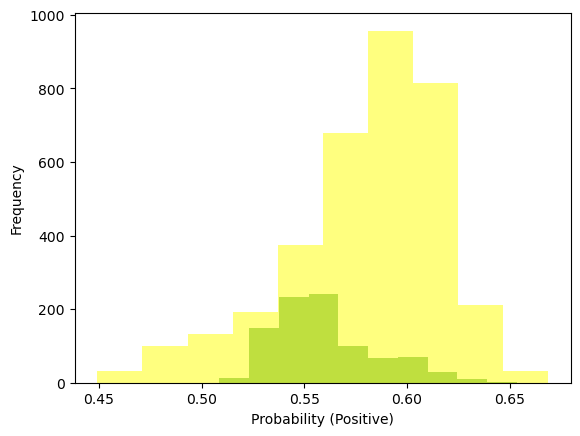

In [249]:
# Visualize if this probability could be a significant feature
pos_prob = metadata_df_cleaned.query('target == 1')['prob_paleoecology']
neg_prob = metadata_df_cleaned.query('target == 0')['prob_paleoecology']

plt.hist(pos_prob, alpha=0.5, label='Positive', color='green')
plt.hist(neg_prob, alpha=0.5, label='Negative', color='yellow')
plt.xlabel('Probability (Positive)')
plt.ylabel('Frequency')

In [ ]:
# metadata_df_cleaned['prob_paleoenvironment'] = metadata_df_cleaned['text_with_abstract'].apply(lambda x: classifier(x, candidate_labels=["paleoenvironment"])['scores'][0])

### Train-Test Split

0.2: small sample

In [238]:
train_df, test_df = train_test_split(metadata_df_cleaned, test_size=0.2, random_state=123)
train_df.head()

,is-referenced-by-count,has_abstract,container-title,language,subject_clean,text_with_abstract,text_wo_abstract,target,0,1,...,375,376,377,378,379,380,381,382,383,prob_paleoecology
1094,2,1,Aquaculture Economics &amp; Management,en,"Ecology Aquatic Science Geography, Planning and Development",Guest Editor’s Introduction,Guest Editor’s Introduction,0,-0.030436,0.069975,...,0.048689,0.039553,0.026197,0.006490,-0.022896,0.021017,0.118466,0.009981,0.007292,0.537315
1798,0,1,Advances in Applied Mathematics,en,Applied Mathematics,Editorial Board,Editorial Board,0,-0.004501,-0.018808,...,0.014887,-0.041473,0.010720,0.003562,-0.062874,0.067547,0.021779,0.043010,0.016237,0.586939
1843,16,1,BMC Infectious Diseases,en,Infectious Diseases,"Continued high incidence of children with severe influenza A(H1N1)pdm09 admitted to paediatric intensive care units in Germany during the first three post-pandemic influenza seasons, 2010/11–2012/...","Continued high incidence of children with severe influenza A(H1N1)pdm09 admitted to paediatric intensive care units in Germany during the first three post-pandemic influenza seasons, 2010/11–2012/13",0,-0.029811,-0.023278,...,0.057882,-0.063561,0.015218,0.031684,0.035105,0.054184,-0.101672,-0.086710,0.090959,0.493212
1613,4,1,Journal of Post Keynesian Economics,en,Economics and Econometrics,Biological Analogies in Economics: A Comment,Biological Analogies in Economics: A Comment,0,0.026884,-0.050199,...,-0.100306,-0.033039,-0.023139,-0.113116,0.039288,0.084419,-0.007648,0.071336,-0.045010,0.606539
168,20,1,Journal of Biogeography,en,"Ecology Ecology, Evolution, Behavior and Systematics",Postglacial Rise and Decline of Ostrya virginiana (Mill.) K. Koch and Carpinus caroliniana Walt. In Eastern North America: Predictable Responses of Forest Species to Cyclic Changes in Seasonality ...,Postglacial Rise and Decline of Ostrya virginiana (Mill.) K. Koch and Carpinus caroliniana Walt. In Eastern North America: Predictable Responses of Forest Species to Cyclic Changes in Seasonality ...,1,0.005049,-0.004586,...,-0.013429,0.026273,-0.043173,-0.006698,-0.023107,-0.058161,-0.111031,-0.099165,-0.009637,0.606560


## 4. More EDA for Train Split

In [239]:
train_df.sort_index()
train_df.info() # check non-null 

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3548 entries, 1094 to 3582
Columns: 393 entries, is-referenced-by-count to prob_paleoecology
dtypes: float32(384), float64(1), int64(2), object(6)
memory usage: 5.5+ MB


In [240]:
pos_df = train_df[train_df["target"] == 1]
neg_df = train_df[train_df["target"] == 0]

In [241]:
print("With Abstract")
sorted_pos_df = pos_df.reindex(pos_df.text_with_abstract.str.len().sort_values().index)
sorted_neg_df = neg_df.reindex(neg_df.text_with_abstract.str.len().sort_values().index)
avg_pos_len = pos_df.text_with_abstract.str.len().mean()
avg_neg_len = neg_df.text_with_abstract.str.len().mean()
print(avg_pos_len)
print(avg_neg_len)

print("Without Abstract")
sorted_pos_df = pos_df.reindex(pos_df.text_wo_abstract.str.len().sort_values().index)
sorted_neg_df = neg_df.reindex(neg_df.text_wo_abstract.str.len().sort_values().index)
avg_pos_len = pos_df.text_wo_abstract.str.len().mean()
avg_neg_len = neg_df.text_wo_abstract.str.len().mean()
print(avg_pos_len)
print(avg_neg_len)


With Abstract
715.1986206896552
850.9546581650726
Without Abstract
109.99862068965517
93.91427559334042


In [242]:
sorted_pos_df.head()

,is-referenced-by-count,has_abstract,container-title,language,subject_clean,text_with_abstract,text_wo_abstract,target,0,1,...,375,376,377,378,379,380,381,382,383,prob_paleoecology
409,25,0,Radiocarbon,en,General Earth and Planetary Sciences Archeology,"Groningen Radiocarbon Dates VIII This list contains dates for Latin America which have mainly been measured during the past few years. The results are grouped into three categories: geologic, ar...",Groningen Radiocarbon Dates VIII,1,0.034320,0.033129,...,-0.025911,0.019142,-0.005271,0.011200,-0.078293,0.043933,-0.005956,-0.014190,-0.021119,0.559176
363,2,1,,en,,Descriptions of WHOI sediment cores,Descriptions of WHOI sediment cores,1,-0.077069,0.082253,...,0.034634,-0.051051,-0.016646,-0.033099,0.020223,0.054839,-0.054518,0.039501,-0.022232,0.542629
699,7,1,Geoscience and Man,en,,In search of a palynological tundra,In search of a palynological tundra,1,0.003445,0.055906,...,0.002818,-0.091916,-0.080965,-0.052994,-0.031261,-0.031518,-0.018006,0.010025,-0.074588,0.551564
437,3,1,Grana,en,"Plant Science Ecology, Evolution, Behavior and Systematics","5. Kožlí (S. Bohemia, Czech Republic)","5. Kožlí (S. Bohemia, Czech Republic)",1,0.010153,0.074133,...,0.003918,-0.019909,0.015716,-0.066683,-0.034438,-0.028744,0.009029,-0.026182,0.030839,0.574390
194,33,1,Geological Society of America Bulletin,en,Geology,"Tropical Lakes, Copropel, and Oil Shale","Tropical Lakes, Copropel, and Oil Shale",1,-0.001706,-0.033976,...,0.019606,0.070733,0.002129,-0.106360,0.012596,-0.023787,-0.055532,0.091155,-0.033124,0.560549


In [243]:
sorted_neg_df.head()

,is-referenced-by-count,has_abstract,container-title,language,subject_clean,text_with_abstract,text_wo_abstract,target,0,1,...,375,376,377,378,379,380,381,382,383,prob_paleoecology
1558,0,1,Concurrency and Computation: Practice and Experience,en,Computational Theory and Mathematics Computer Networks and Communications Computer Science Applications Theoretical Computer Science Software,Note,Note,0,-0.016803,0.016399,...,0.043060,0.024369,0.037302,0.000931,0.044971,0.136418,-0.007139,0.050414,0.038337,0.540541
961,0,1,Veterinary Clinics of North America: Exotic Animal Practice,en,General Medicine Small Animals,Index,Index,0,0.031928,0.048150,...,0.022372,-0.031188,0.053783,0.018183,0.035711,0.088056,-0.021572,-0.049431,-0.015297,0.602259
786,15,1,Material Religion,en,Religious studies Visual Arts and Performing Arts,Space,Space,0,0.019268,-0.026502,...,0.055303,-0.063299,0.078903,-0.102819,0.061901,0.013764,0.048346,-0.040576,0.035335,0.574556
1451,0,1,Anthrozoös,en,Sociology and Political Science Veterinary (miscellaneous) Animal Science and Zoology Anthropology Education,Index,Index,0,0.031928,0.048150,...,0.022372,-0.031188,0.053783,0.018183,0.035711,0.088056,-0.021572,-0.049431,-0.015297,0.602259
1725,0,1,Journal of Post Keynesian Economics,en,Economics and Econometrics,Reply,Reply,0,-0.031463,0.012301,...,0.021401,0.050894,0.009608,-0.011125,0.034348,0.092186,-0.073571,0.012452,-0.086887,0.562497


#### Word Cloud

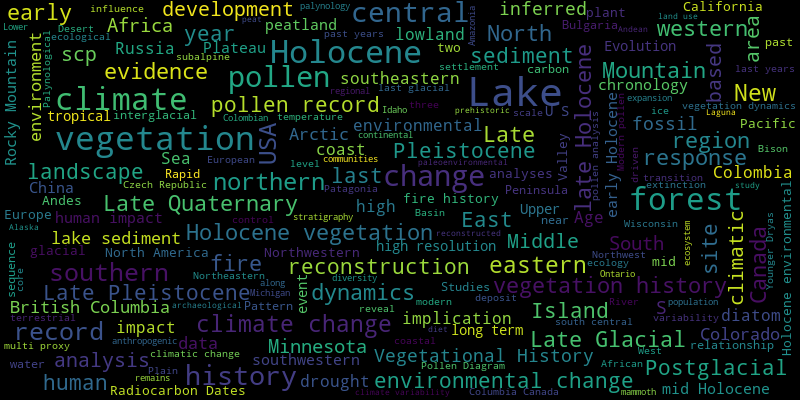

In [185]:
from wordcloud import WordCloud

pos_text = " ".join(train_df[train_df["target"] == 1]["text_wo_abstract"].tolist())
neg_text = " ".join(train_df[train_df["target"] == 0]["text_wo_abstract"].tolist())

wordcloud = WordCloud(max_font_size=40, width=800, height=400)
wordcloud.generate(pos_text).to_image()

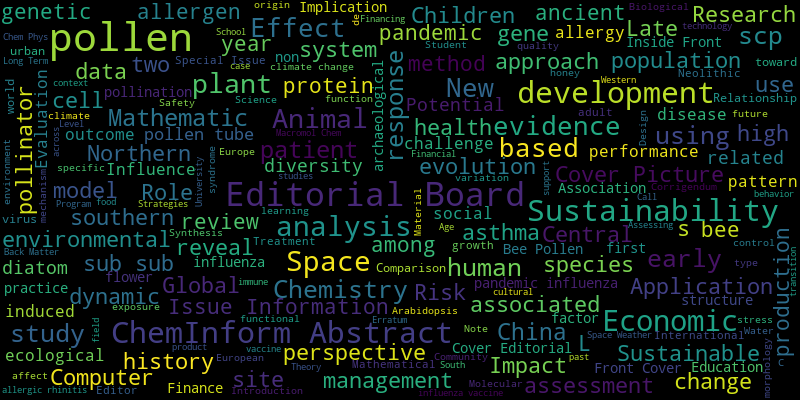

In [186]:
wordcloud.generate(neg_text).to_image()

#### Examine class distribution in train split

In [187]:
train_df["target"].value_counts(normalize=True)

0    0.79566
1    0.20434
Name: target, dtype: float64

## 5. Baseline Modelling

In [188]:
train_df.columns

Index(['is-referenced-by-count', 'has_abstract', 'container-title', 'language',
       'subject_clean', 'text_with_abstract', 'text_wo_abstract', 'target',
       '0', '1',
       ...
       '374', '375', '376', '377', '378', '379', '380', '381', '382', '383'],
      dtype='object', length=392)

##### Split X and y

- Using Text Without Abstract
- Use ordinal journal & 3-category author

In [189]:
# No author, Subject separate, language imputed, journal separate
feature = ['is-referenced-by-count', 'has_abstract', 'container-title', 
       'subject_clean', 'text_with_abstract', 'text_wo_abstract']

X_train, y_train = train_df.drop(columns = ["target", "text_wo_abstract", "text_with_abstract", "language"]), train_df["target"]
X_test, y_test = test_df.drop(columns = ["target", "text_wo_abstract", "text_with_abstract", "language"]), test_df["target"]

In [190]:
X_train.columns

Index(['is-referenced-by-count', 'has_abstract', 'container-title',
       'subject_clean', '0', '1', '2', '3', '4', '5',
       ...
       '374', '375', '376', '377', '378', '379', '380', '381', '382', '383'],
      dtype='object', length=388)

##### Define Pre-Processing Pipeline

In [217]:
from sklearn.compose import make_column_transformer, ColumnTransformer
from sklearn.preprocessing import OneHotEncoder, StandardScaler, OrdinalEncoder, FunctionTransformer

# Dividing the feature types
# text_features = "text_with_abstract"
binary_feature = ['has_abstract']
numeric_features = ["is-referenced-by-count"]
# ohe_features = ['container-title']
bow_features = 'subject_clean'
drop_feature = ['container-title']

binary_transformer = OneHotEncoder(drop='if_binary', dtype = int)
ohe_transformer = OneHotEncoder(handle_unknown="ignore", sparse_output=False, dtype = int)
numeric_transformer = StandardScaler()
text_transformer = CountVectorizer(stop_words="english", max_features= 1000)


# Create the column transformer
preprocessor = ColumnTransformer(
    transformers = [
    ("num_preprocessor", numeric_transformer, numeric_features),
    ("binary_preprossor", binary_transformer, binary_feature),
    # ("cat_preprocessor", ohe_transformer, ohe_features),
    ("bow_preprocessor", text_transformer, bow_features),
    ("drop", "drop", drop_feature)
    ],
    remainder = "passthrough"
)

preprocessor

ColumnTransformer(remainder='passthrough',
                  transformers=[('num_preprocessor', StandardScaler(),
                                 ['is-referenced-by-count']),
                                ('binary_preprossor',
                                 OneHotEncoder(drop='if_binary',
                                               dtype=<class 'int'>),
                                 ['has_abstract']),
                                ('bow_preprocessor',
                                 CountVectorizer(max_features=1000,
                                                 stop_words='english'),
                                 'subject_clean'),
                                ('drop', 'drop', ['container-title'])])

##### Check Transformed Data

In [218]:
transformed_X_train = preprocessor.fit_transform(X_train)
transformed_X_train

array([[-0.335283  ,  1.        ,  0.        , ...,  0.11846554,
         0.00998051,  0.00729207],
       [-0.38642152,  1.        ,  0.        , ...,  0.02177939,
         0.04300968,  0.01623728],
       [ 0.02268659,  1.        ,  0.        , ..., -0.10167152,
        -0.08671049,  0.09095907],
       ...,
       [-0.38642152,  1.        ,  0.        , ..., -0.10723689,
         0.14124392, -0.02723924],
       [-0.38642152,  0.        ,  0.        , ..., -0.07783657,
        -0.04603828, -0.00886853],
       [-0.38642152,  0.        ,  0.        , ...,  0.0134309 ,
        -0.02172487, -0.02550966]])

In [219]:
col_names = (preprocessor.named_transformers_["num_preprocessor"].get_feature_names_out().tolist() + 
             preprocessor.named_transformers_["binary_preprossor"].get_feature_names_out().tolist() + 
            #  preprocessor.named_transformers_["cat_preprocessor"].get_feature_names_out().tolist() + 
             preprocessor.named_transformers_["bow_preprocessor"].get_feature_names_out().tolist() + 
             embeddings_df.columns.tolist())
len(col_names)

709

In [220]:

transformed_X_train_df = pd.DataFrame(transformed_X_train, columns=col_names)
transformed_X_train_df.shape

(3548, 709)

In [221]:
len(preprocessor.named_transformers_["bow_preprocessor"].get_feature_names_out().tolist())

323

In [223]:
# len(preprocessor.named_transformers_["cat_preprocessor"].get_feature_names_out().tolist())

#### Logistic Regression

In [224]:
from sklearn.linear_model import LogisticRegression 

# The model pipeline

logreg_model = make_pipeline(preprocessor, LogisticRegression(max_iter=1000, random_state=123))

# The mean and std of the cross validated scores for all metrics as a dataframe

classification_metrics = ["accuracy", "precision", "recall", "f1"]

cross_val_results= {}
cross_val_results['logreg'] = pd.DataFrame(
    cross_validate(
        logreg_model,
        X_train,
        y_train,
        scoring=classification_metrics,
        return_train_score=True
    )
).agg(['mean', 'std']).round(3).T

cross_val_results['logreg']

,mean,std
fit_time,0.115,0.015
score_time,0.018,0.003
test_accuracy,0.965,0.006
train_accuracy,0.975,0.002
test_precision,0.949,0.020
train_precision,0.970,0.006
test_recall,0.874,0.019
train_recall,0.905,0.004
test_f1,0.910,0.015
train_f1,0.936,0.005


#### LogReg - Preliminary investigation on feature importance for Logistic Regression

In [225]:
model_params = logreg_model.named_steps['logisticregression'].get_params()
model_params

{'C': 1.0,
 'class_weight': None,
 'dual': False,
 'fit_intercept': True,
 'intercept_scaling': 1,
 'l1_ratio': None,
 'max_iter': 1000,
 'multi_class': 'auto',
 'n_jobs': None,
 'penalty': 'l2',
 'random_state': 123,
 'solver': 'lbfgs',
 'tol': 0.0001,
 'verbose': 0,
 'warm_start': False}

In [226]:
logreg_model.fit(X_train, y_train)

Pipeline(steps=[('columntransformer',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('num_preprocessor',
                                                  StandardScaler(),
                                                  ['is-referenced-by-count']),
                                                 ('binary_preprossor',
                                                  OneHotEncoder(drop='if_binary',
                                                                dtype=<class 'int'>),
                                                  ['has_abstract']),
                                                 ('bow_preprocessor',
                                                  CountVectorizer(max_features=1000,
                                                                  stop_words='english'),
                                                  'subject_clean'),
                                                 ('drop', 'drop',
                                                  ['container-title'])])),
                ('logisticregression',
                 LogisticRegression(max_iter=1000, random_state=123))])

In [227]:
data = {
    "coefficient": logreg_model.named_steps['logisticregression'].coef_.flatten().tolist(),
    "magnitude": np.absolute(
        logreg_model.named_steps['logisticregression'].coef_.flatten().tolist()
    ),
}
coef_df = pd.DataFrame(data, index=col_names).sort_values(
    "magnitude", ascending=False
)

# Top 30 features contributing for positive class
coef_df.query('coefficient > 0').head(30)

,coefficient,magnitude
128,2.058261,2.058261
has_abstract_1,1.647876,1.647876
332,1.601820,1.601820
190,1.570269,1.570269
96,1.496357,1.496357
273,1.468023,1.468023
162,1.446443,1.446443
18,1.365346,1.365346
323,1.340720,1.340720
321,1.335135,1.335135


In [228]:
# Top 30 features contributing for negative class
coef_df.query('coefficient < 0').head(30)

,coefficient,magnitude
159,-1.996517,1.996517
191,-1.687162,1.687162
73,-1.588027,1.588027
311,-1.489114,1.489114
26,-1.394945,1.394945
148,-1.303475,1.303475
229,-1.285626,1.285626
44,-1.245813,1.245813
245,-1.230201,1.230201
52,-1.224384,1.224384


#### Recall by Group

In [229]:
from sklearn.metrics import recall_score
# Make predictions
predictions = logreg_model.predict(X_train)

# Add the predictions to the original DataFrame
train_df['predictions'] = predictions

# Group the data by a specific feature
grouped_data = train_df.groupby('has_abstract')

# Calculate recall for each group
grouped_recall = grouped_data.apply(lambda x: recall_score(x['target'], x['predictions']))

# Print the recall by group
print(grouped_recall)

has_abstract
0    0.811321
1    0.972973
dtype: float64


#### Model Mistakes

In [230]:
logreg_model.fit(X_train, y_train)

train_df['y_pred'] = logreg_model.predict(X_train)
# train_df['y_predictproba'] = logreg_model.predict_proba(X_train)

train_df.head(5)

# False Positives
train_df.query('target == 0 & y_pred == 1').head()

# False Negative
train_df.query('target == 1 & y_pred == 0').head()


,is-referenced-by-count,has_abstract,container-title,language,subject_clean,text_with_abstract,text_wo_abstract,target,0,1,...,376,377,378,379,380,381,382,383,predictions,y_pred
3546,5,0,Science,en,Multidisciplinary,"Droughts and societal change: The environmental context for the emergence of Islam in late Antique Arabia In Arabia, the first half of the sixth century CE was marked by the demise of Himyar, the...",Droughts and societal change: The environmental context for the emergence of Islam in late Antique Arabia,1,-0.007667,0.135362,...,0.046464,0.000131,-0.022820,-0.026862,0.062914,-0.029203,0.021492,-0.020467,0,0
3326,6,0,Oecologia,en,"Ecology, Evolution, Behavior and Systematics",Predicting habitat use by the Argentine hake Merluccius hubbsi in a warmer world: inferences from the Middle Holocene Fish skeletal remains recovered from two archaeological sites dated in the Mi...,Predicting habitat use by the Argentine hake Merluccius hubbsi in a warmer world: inferences from the Middle Holocene,1,-0.045271,0.101332,...,0.048800,-0.006095,-0.027394,0.069519,0.077004,-0.029384,-0.054234,0.000457,0,0
3374,12,0,Scientific Data,en,"Library and Information Sciences Statistics, Probability and Uncertainty Computer Science Applications Education Information Systems Statistics and Probability","p3k14c, a synthetic global database of archaeological radiocarbon dates Archaeologists increasingly use large radiocarbon databases to model prehistoric human demography (also termed paleo-demogr...","p3k14c, a synthetic global database of archaeological radiocarbon dates",1,-0.075282,0.070110,...,0.058668,0.033686,0.021805,-0.020881,0.123094,-0.104703,-0.093247,-0.050356,0,0
2617,32,0,Nature,en,Multidisciplinary,"Dire wolves were the last of an ancient New World canid lineage Dire wolves are considered to be one of the most common and widespread large carnivores in Pleistocene America<sup>1</sup>, yet rel...",Dire wolves were the last of an ancient New World canid lineage,1,-0.159181,0.024300,...,0.022273,-0.021869,0.022916,0.083337,0.056286,-0.064959,0.041914,-0.012493,0,0
3925,6,0,Data in Brief,en,Multidisciplinary,"A dataset for distribution and characteristics of Holocene pyroclastic fall deposits along the Pacific coasts in western Hokkaido, Japan The tephra layers known with eruption ages play an importa...","A dataset for distribution and characteristics of Holocene pyroclastic fall deposits along the Pacific coasts in western Hokkaido, Japan",1,-0.013847,0.042167,...,0.066377,-0.018755,-0.027124,0.047283,0.057765,0.006733,-0.084097,-0.026971,0,0


### Build and Compare Multiple Models

Note: Remove year, Using Abstract, Using Author

In [231]:
# Helper function for comparing models
def mean_std_cross_val_scores(model, X_train, y_train, **kwargs):
    """
    Returns pandas Series with mean and std of cross validation
    """
    scores = cross_validate(model, X_train, y_train, **kwargs)
    mean_scores = pd.DataFrame(scores).mean()
    std_scores = pd.DataFrame(scores).std()
    out_col = []
    for i in range(len(mean_scores)):
        out_col.append((f"%0.3f (+/- %0.3f)" % (mean_scores[i], std_scores[i])))
    return pd.Series(data=out_col, index=mean_scores.index)


In [258]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import BernoulliNB, GaussianNB, MultinomialNB
from lightgbm.sklearn import LGBMClassifier

results_dict = {}
models = {
	"dummy": DummyClassifier(random_state = 123),
    'logisticRegression': LogisticRegression(max_iter=1000, random_state=123),
    "decision tree": DecisionTreeClassifier(random_state=123, max_depth=200),
    "kNN": KNeighborsClassifier(),
    'NaiveBayes': BernoulliNB(),
    "RBF SVM": SVC(random_state=123),
    'RF': RandomForestClassifier(class_weight="balanced", random_state=123),
    'LGBM': LGBMClassifier(random_state=123)
    }

for key, model in models.items():
    pipe = make_pipeline(preprocessor, model)
    results_dict[key] = mean_std_cross_val_scores(pipe, X_train, y_train, cv=5, return_train_score=True, scoring=classification_metrics)

results_df = pd.DataFrame(results_dict).T
results_df



/Users/kw/opt/miniconda3/envs/591/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/kw/opt/miniconda3/envs/591/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/kw/opt/miniconda3/envs/591/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/kw/opt/miniconda3/envs/591/lib/python3.10/site-pack

,fit_time,score_time,test_accuracy,train_accuracy,test_precision,train_precision,test_recall,train_recall,test_f1,train_f1
dummy,0.037 (+/- 0.008),0.014 (+/- 0.002),0.796 (+/- 0.000),0.796 (+/- 0.000),0.000 (+/- 0.000),0.000 (+/- 0.000),0.000 (+/- 0.000),0.000 (+/- 0.000),0.000 (+/- 0.000),0.000 (+/- 0.000)
logisticRegression,0.117 (+/- 0.015),0.017 (+/- 0.002),0.965 (+/- 0.006),0.975 (+/- 0.002),0.949 (+/- 0.020),0.970 (+/- 0.006),0.874 (+/- 0.019),0.905 (+/- 0.004),0.910 (+/- 0.015),0.936 (+/- 0.005)
decision tree,1.483 (+/- 0.198),0.015 (+/- 0.001),0.897 (+/- 0.005),1.000 (+/- 0.000),0.735 (+/- 0.021),1.000 (+/- 0.000),0.775 (+/- 0.035),1.000 (+/- 0.000),0.754 (+/- 0.013),1.000 (+/- 0.000)
kNN,0.030 (+/- 0.002),0.051 (+/- 0.002),0.939 (+/- 0.011),0.957 (+/- 0.004),0.864 (+/- 0.041),0.917 (+/- 0.006),0.836 (+/- 0.036),0.868 (+/- 0.013),0.849 (+/- 0.026),0.892 (+/- 0.010)
NaiveBayes,0.051 (+/- 0.002),0.018 (+/- 0.001),0.919 (+/- 0.011),0.919 (+/- 0.003),0.732 (+/- 0.026),0.731 (+/- 0.008),0.950 (+/- 0.009),0.953 (+/- 0.003),0.827 (+/- 0.020),0.828 (+/- 0.005)
RBF SVM,0.695 (+/- 0.005),0.173 (+/- 0.006),0.953 (+/- 0.007),0.967 (+/- 0.003),0.958 (+/- 0.024),0.983 (+/- 0.004),0.808 (+/- 0.023),0.851 (+/- 0.014),0.877 (+/- 0.020),0.912 (+/- 0.010)
RF,2.172 (+/- 0.025),0.028 (+/- 0.001),0.950 (+/- 0.005),1.000 (+/- 0.000),0.968 (+/- 0.015),1.000 (+/- 0.000),0.781 (+/- 0.026),1.000 (+/- 0.000),0.864 (+/- 0.015),1.000 (+/- 0.000)
LGBM,1.262 (+/- 0.084),0.019 (+/- 0.002),0.965 (+/- 0.005),1.000 (+/- 0.000),0.952 (+/- 0.021),1.000 (+/- 0.000),0.874 (+/- 0.016),1.000 (+/- 0.000),0.912 (+/- 0.011),1.000 (+/- 0.000)


### Feature Selection

#### Intermediate Results Summary (Latest Data, With Sentence Embeddings)

- Word Embedding, Journal Name, OHE subject
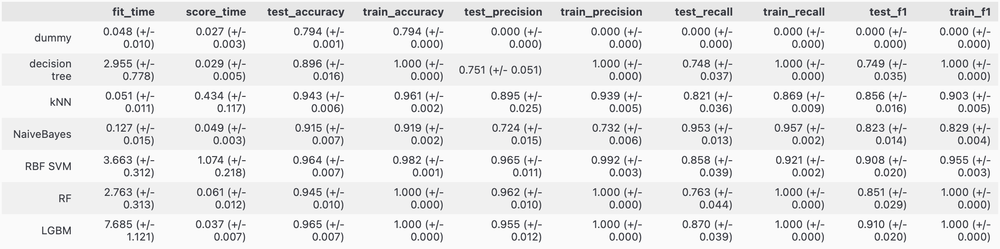

- Word Embeddings, Journal Name, BOW subject

Converting OHE subject to BOW subject reduced dimension by around 350

Xtrain has 1891 input features

Test recall improved for LGBM
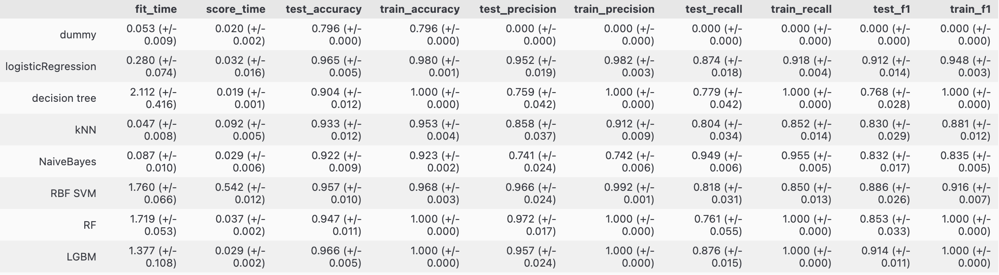

- Word Embeddings, Remove Journal Name, BOW subject

Removing Journal name reduce the dimension of input X_train to 709 features only.

This also makes the model more generalizable and does not rely on journal titles. 

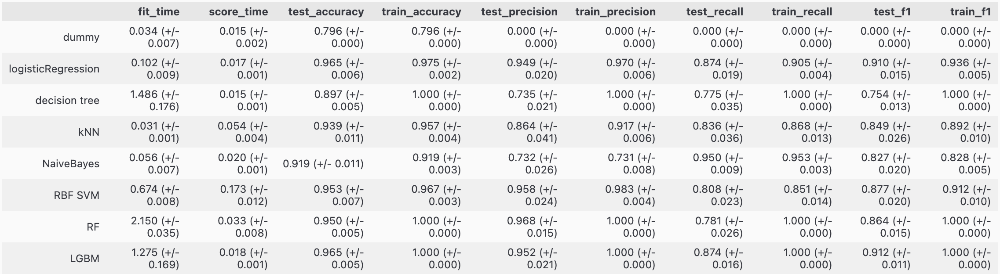

- Word Embeddings, Remove Journal Name, BOW subject, + transformer's paleoecology probability prediction

Using bert-base-uncased model, the output does not seem to be trustworthy:

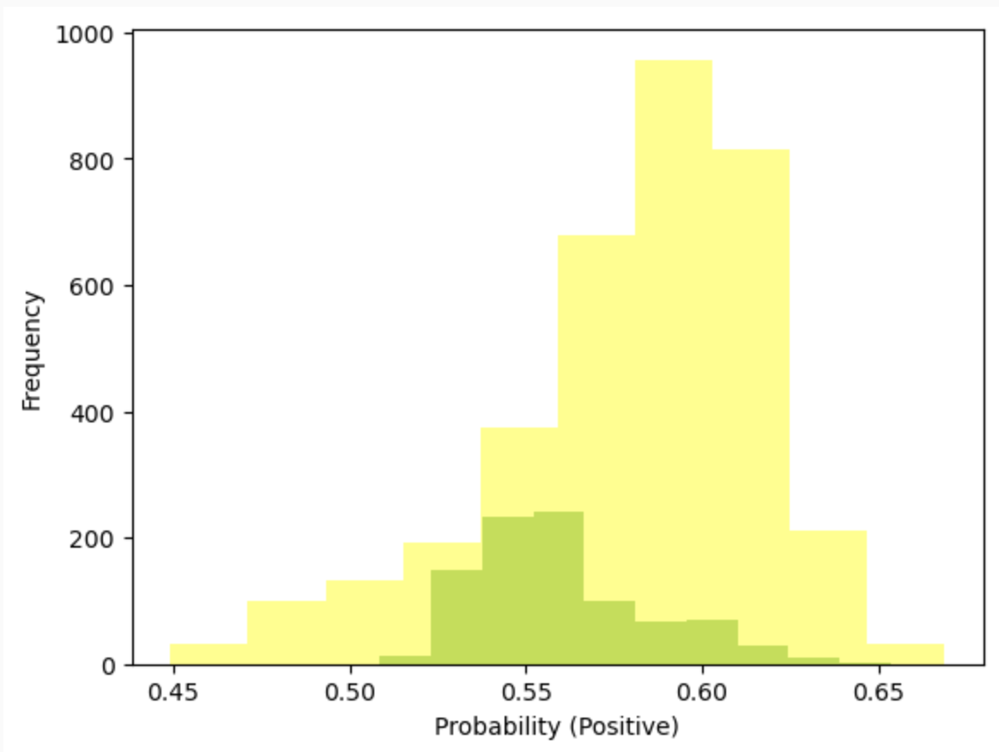{ width=500 height=400 }

### Model Evaluation and Interpretation

- So far, the best model is: 
    - Naive Bayes with word embeddings, no journal title, and bow subject. (Though it could introduce more false positives)

In [259]:
final_pipeline = make_pipeline(preprocessor, BernoulliNB(alpha=1))
final_pipeline.fit(X_train, y_train)

test_score = final_pipeline.score(X_test, y_test)
test_score

0.8996617812852311

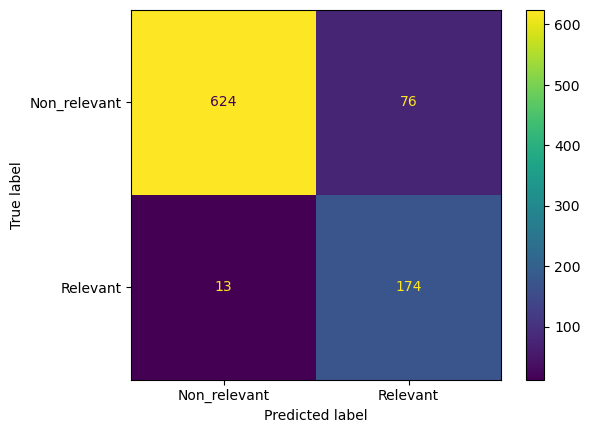

In [260]:
from sklearn.metrics import ConfusionMatrixDisplay
cm = ConfusionMatrixDisplay.from_estimator(
    final_pipeline, X_test, y_test, values_format="d", display_labels=["Non_relevant", "Relevant"]
)


#### Intermediate Results Summary (During iteration 2, for feature engineering : with data from May12)

- Exclude abstract, use binary author, keep OHE journal:
![result1](../assets/author_binary.png)

- Exclude abstract, use binary author and binary journal:
![result2](../assets/author_journal_binary.png)



- Exclude abstract, use 3-category author, ordinal journal, imputed language

![image.png](attachment:image.png)

- Exclude abstract, Exclude 3-category author; Use ordinal journal, imputed language

(conclusion: Author seems to be a informative variable)

![image.png](attachment:image.png)

- Include Abstract, use 3-category author, ordinal journal, imputed language
![image.png](attachment:image.png)

- Drop Year, Include Abstract, use 3-category author, ordinal journal, imputed language

![image.png](attachment:image.png)

#### LogReg - Hyperparameter Tuning for Logistic Regression

In [ ]:
# from scipy.stats import loguniform, randint

# # fit the model
# logreg_model.fit(X_train, y_train)

# # get the length of the vocabulary
# vocab_len = len(  
#     logreg_model.named_steps["columntransformer"]
#     .named_transformers_["countvectorizer"]
#     .get_feature_names_out()
# )
# # create a distribution of the parameters
# param_dist = {  
#     # "columntransformer__countvectorizer__max_features": np.arange(5000, vocab_len, 200),
#     "logisticregression__C": loguniform(1e-3, 1e3),
#     "logisticregression__class_weight": ["balanced", None],
# }

# # Perform a randomized search 
# random_search = RandomizedSearchCV(  
#     logreg_model,
#     param_distributions=param_dist,
#     n_iter=10,
#     verbose=1,
#     n_jobs=-1,
#     scoring='recall',
#     random_state=123,
# )
# random_search.fit(X_train, y_train)